In [10]:
import osmnx as ox
import matplotlib.pyplot as plt
import folium

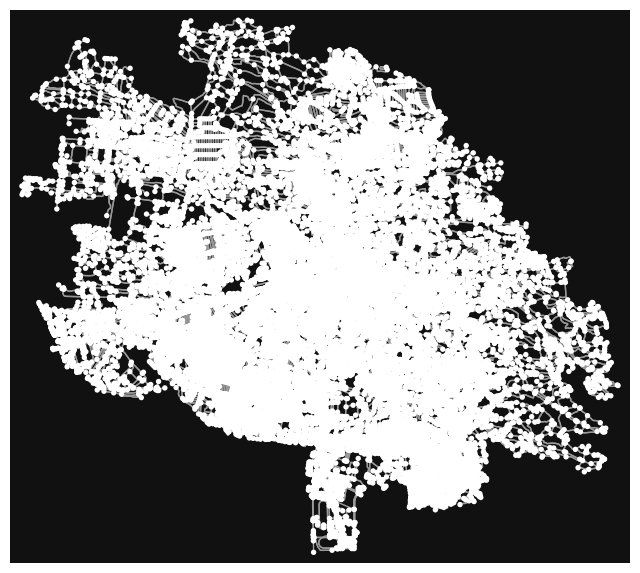

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [11]:
ox.plot_graph(ox.graph_from_place('Lviv, Ukraine'))

In [12]:
G = ox.graph_from_place('Lviv, Ukraine', network_type="drive")
G

In [13]:
#ox.plot_graph_folium(G)

# Get the centroid coordinates of the nodes to center the map
nodes = ox.graph_to_gdfs(G, nodes=True, edges=False)
center_latlng = nodes.unary_union.centroid.coords[0]
center_lat, center_lng = center_latlng[1], center_latlng[0]

# Create a Folium map centered on the graph
m = folium.Map(location=[center_lat, center_lng], zoom_start=12)

# Convert graph edges to GeoDataFrame and add them as GeoJSON to the map
edges = ox.graph_to_gdfs(G, nodes=False)
folium.GeoJson(edges).add_to(m)

# Display the interactive map
m

/var/folders/cq/plchsc1x3zj4_pqrcw3s6rfw0000gn/T/ipykernel_3778/206828666.py:5: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  center_latlng = nodes.unary_union.centroid.coords[0]


In [14]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
gdf_nodes.head()

,y,x,street_count,highway,railway,ref,junction,geometry
osmid,,,,,,,,
30508647,49.822245,23.973219,3,NaN,NaN,NaN,NaN,POINT (23.97322 49.82225)
30508651,49.827064,23.982754,4,traffic_signals,NaN,NaN,NaN,POINT (23.98275 49.82706)
30508663,49.825149,23.988873,3,NaN,NaN,NaN,NaN,POINT (23.98887 49.82515)
30508665,49.825836,23.990868,3,NaN,NaN,NaN,NaN,POINT (23.99087 49.82584)
30508679,49.834410,24.006417,3,NaN,NaN,NaN,NaN,POINT (24.00642 49.83441)


In [15]:
gdf_edges.head()

osmid      highway  \
u        v          key                                                   
30508647 1660535520 0                             33868674  residential   
         261710438  0    [161248896, 285692739, 374773227]    secondary   
         267160516  0               [693078462, 467982679]    secondary   
30508651 8328640415 0                           1062676773    secondary   
         373161838  0                             33075644    secondary   

                          lanes                   name  oneway reversed  \
u        v          key                                                   
30508647 1660535520 0         1  вулиця Вука Караджича   False     True   
         261710438  0    [6, 4]       Любінська вулиця   False     True   
         267160516  0    [6, 4]       Любінська вулиця   False    False   
30508651 8328640415 0         5       Любінська вулиця   False    False   
         373161838  0         2         Окружна вулиця    True    False   

                             length  \
u        v          key               
30508647 1660535520 0    198.786795   
         261710438  0    353.548128   
         267160516  0    357.259125   
30508651 8328640415 0     61.530303   
         373161838  0    373.224136   

                                                                  geometry  \
u        v          key                                                      
30508647 1660535520 0    LINESTRING (23.97322 49.82225, 23.97309 49.822...   
         261710438  0    LINESTRING (23.97322 49.82225, 23.97262 49.822...   
         267160516  0    LINESTRING (23.97322 49.82225, 23.97324 49.822...   
30508651 8328640415 0    LINESTRING (23.98275 49.82706, 23.98212 49.82669)   
         373161838  0    LINESTRING (23.98275 49.82706, 23.98256 49.827...   

                        maxspeed  ref bridge width access junction tunnel  
u        v          key                                                    
30508647 1660535520 0        NaN  NaN    NaN   NaN    NaN      NaN    NaN  
         261710438  0         50  NaN    NaN   NaN    NaN      NaN    NaN  
         267160516  0         50  NaN    NaN   NaN    NaN      NaN    NaN  
30508651 8328640415 0         50  NaN    NaN   NaN    NaN      NaN    NaN  
         373161838  0        NaN  NaN    NaN   NaN    NaN      NaN    NaN

In [16]:
#gdf = ox.geometries_from_place("Kyiv, Ukraine", {"amenity": True, "building": True, "highway": True})
tags = {"amenity": True, "building": True, "highway": True}
gdf = ox.features_from_place("Kyiv, Ukraine", tags)

KeyboardInterrupt: 

In [ ]:
gdf.head()

NameError: name 'gdf' is not defined

In [ ]:
gdf['highway'].unique()

array(['traffic_signals', 'crossing', 'motorway_junction', 'give_way',
       'mini_roundabout', nan, 'bus_stop', 'street_lamp', 'stop',
       'turning_circle', 'elevator', 'rest_area', 'turning_loop',
       'services', 'traffic_mirror', 'speed_camera', 'milestone',
       'raceway', 'residential', 'primary', 'secondary', 'trunk',
       'tertiary', 'service', 'pedestrian', 'trunk_link', 'primary_link',
       'secondary_link', 'construction', 'unclassified', 'tertiary_link',
       'footway', 'proposed', 'living_street', 'steps', 'path', 'track',
       'cycleway', 'motorway_link', 'bridleway', 'motorway', 'closed',
       'corridor', 'road'], dtype=object)

In [ ]:
gdf['amenity'].unique()

array([nan, 'school', 'pub', 'dentist', 'post_office', 'cafe',
       'restaurant', 'atm', 'bench', 'pharmacy', 'fast_food', 'fuel',
       'parking', 'toilets', 'bank', 'cinema', 'water_point',
       'drinking_water', 'clinic', 'car_wash', 'doctors',
       'bureau_de_change', 'university', 'fountain', 'arts_centre',
       'place_of_worship', 'kindergarten', 'library', 'bar', 'post_box',
       'theatre', 'studio', 'nightclub', 'recycling', 'waste_disposal',
       'bicycle_rental', 'taxi', 'stripclub', 'veterinary',
       'vending_machine', 'police', 'parking_entrance', 'car_sharing',
       'townhall', 'hospital', 'office', 'waste_basket',
       'social_facility', 'community_centre', 'bicycle_parking',
       'college', 'driving_school', 'food_court', 'music_school',
       'car_rental', 'shelter', 'marketplace', 'boat_rental',
       'money_transfer', 'payment_terminal', 'agency', 'parking_space',
       'ticket_validator', 'clock', 'beauty', 'language_school',
       'bus_stat

In [ ]:
gdf['building'].unique()

array([nan, 'commercial', 'church', 'yes', 'kiosk', 'pavilion', 'bunker',
       'dormitory', 'university', 'retail', 'hospital', 'house',
       'industrial', 'chapel', 'shed', 'garage', 'temple', 'service',
       'roof', 'residential', 'ruins', 'garages', 'construction',
       'detached', 'apartments', 'office', 'kindergarten', 'school',
       'sports_centre', 'public', 'civic', 'government', 'hangar',
       'college', 'fire_station', 'warehouse', 'hotel', 'transportation',
       'shop', 'parking', 'collapsed', 'barn', 'swimming_pool', 'mall',
       'greenhouse', 'synagogue', 'cathedral', 'terrace', 'collage',
       'silo', 'supermarket', 'semidetached_house', 'clinic',
       'manufacture', 'train_station', 'gatehouse', 'grandstand',
       'administrative', 'stands', 'farm_auxiliary',
       'greenhouse_horticulture', 'guardhouse', 'cabin', 'toilets',
       'bridge', 'water_tower', 'movie_studio', 'allotment_house',
       'boathouse', 'houseboat', 'static_caravan', 'securi

In [ ]:
gdf['building'].value_counts()

building
yes              59899
apartments        9819
house             5153
industrial        2009
garages           1732
                 ...  
water_tower          1
gatehouse            1
silo                 1
swimming_pool        1
abandoned=yes        1
Name: count, Length: 95, dtype: int64

In [ ]:
a = gdf['amenity'].value_counts()
a[a.index=='school']

amenity
school    526
Name: count, dtype: int64

In [ ]:
gdf[gdf["building"].isin(['residential', 'apartments', 'house'])]

highway   
element_type osmid                
node         3344152314     NaN  \
             3344152315     NaN   
             3344152316     NaN   
             3344152317     NaN   
             3353489663     NaN   
...                         ...   
relation     14726600       NaN   
             15479250       NaN   
             15579079       NaN   
             15678574       NaN   
             15698640       NaN   

                                                                  geometry   
element_type osmid                                                           
node         3344152314                          POINT (30.61897 50.38042)  \
             3344152315                          POINT (30.61886 50.38022)   
             3344152316                          POINT (30.61319 50.37982)   
             3344152317                          POINT (30.61324 50.37966)   
             3353489663                          POINT (30.60943 50.37943)   
...                                                                    ...   
relation     14726600    POLYGON ((30.52367 50.44662, 30.52390 50.44653...   
             15479250    POLYGON ((30.55476 50.40738, 30.55507 50.40741...   
             15579079    POLYGON ((30.49359 50.51568, 30.49376 50.51567...   
             15678574    POLYGON ((30.46773 50.39186, 30.46775 50.39184...   
             15698640    POLYGON ((30.52972 50.40284, 30.52980 50.40283...   

                        crossing crossing_ref button_operated   
element_type osmid                                              
node         3344152314      NaN          NaN             NaN  \
             3344152315      NaN          NaN             NaN   
             3344152316      NaN          NaN             NaN   
             3344152317      NaN          NaN             NaN   
             3353489663      NaN          NaN             NaN   
...                          ...          ...             ...   
relation     14726600        NaN          NaN             NaN   
             15479250        NaN          NaN             NaN   
             15579079        NaN          NaN             NaN   
             15678574        NaN          NaN             NaN   
             15698640        NaN          NaN             NaN   

                        traffic_signals:sound traffic_signals:vibration   
element_type osmid                                                        
node         3344152314                   NaN                       NaN  \
             3344152315                   NaN                       NaN   
             3344152316                   NaN                       NaN   
             3344152317                   NaN                       NaN   
             3353489663                   NaN                       NaN   
...                                       ...                       ...   
relation     14726600                     NaN                       NaN   
             15479250                     NaN                       NaN   
             15579079                     NaN                       NaN   
             15678574                     NaN                       NaN   
             15698640                     NaN                       NaN   

                        crossing:island traffic_signals barrier  ...   
element_type osmid                                               ...   
node         3344152314             NaN             NaN     NaN  ...  \
             3344152315             NaN             NaN     NaN  ...   
             3344152316             NaN             NaN     NaN  ...   
             3344152317             NaN             NaN     NaN  ...   
             3353489663             NaN             NaN     NaN  ...   
...                                 ...             ...     ...  ...   
relation     14726600               NaN             NaN     NaN  ...   
             15479250               NaN             NaN     NaN  ...   
           

In [ ]:
gdf[['place']]

place
element_type osmid         
node         10980674   NaN
             10980679   NaN
             10980707   NaN
             10980710   NaN
             10980711   NaN
...                     ...
relation     16087842   NaN
             16151721   NaN
             16217702   NaN
             16219009   NaN
             16226184   NaN

[380276 rows x 1 columns]

In [ ]:
schools = gdf[gdf["amenity"] == "school"]
hospitals = gdf[gdf["amenity"] == "hospital"]
roads = gdf[gdf["highway"].isin(['primary', 'secondary', 'road', 'residential', 'pedestrian'])]
residential = gdf[gdf["building"].isin(['residential', 'apartments', 'house'])]

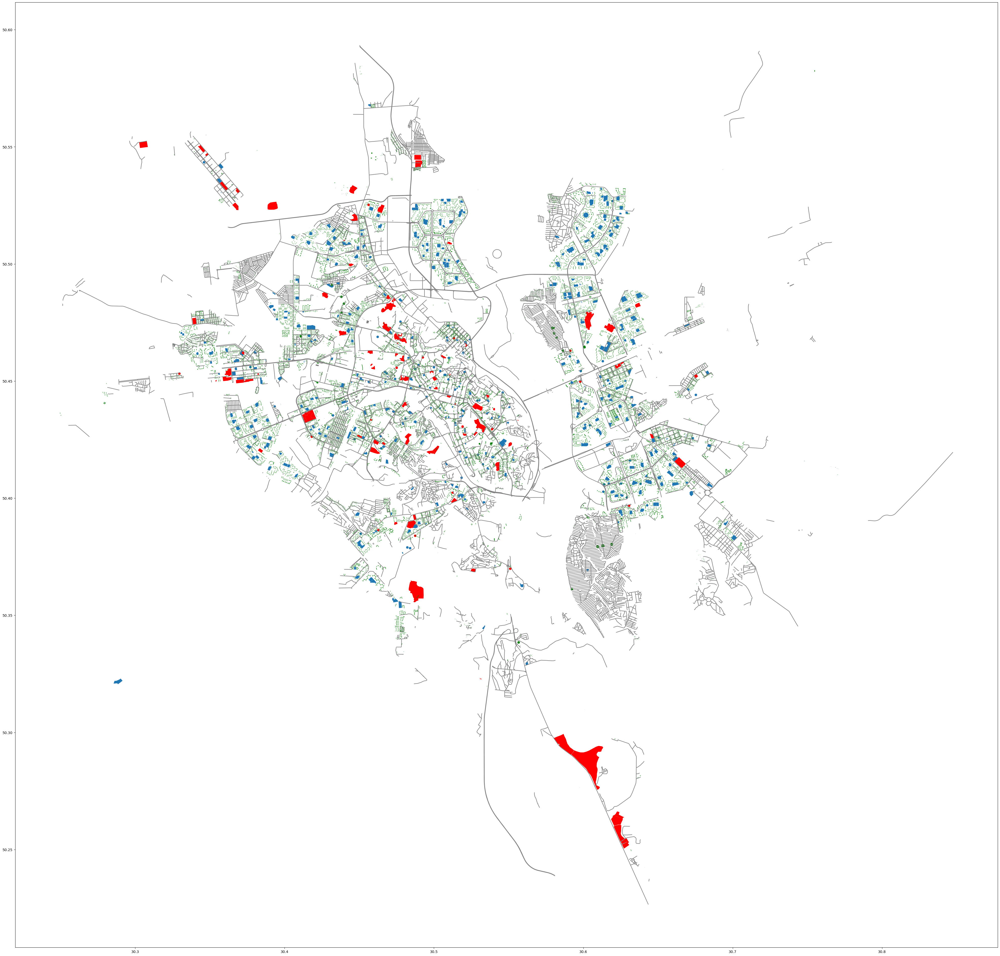

In [ ]:
fig, ax = plt.subplots()
ax.set_aspect('equal')
schools.plot(ax=ax, figsize=(50,50))
hospitals.plot(ax=ax, figsize=(50,50), color='red')
roads.plot(ax=ax, figsize=(50,50), color='grey')
residential.plot(ax=ax, figsize=(50,50), color='green')

fig.set_figwidth(50)
fig.set_figheight(50)
plt.show()

<Axes: >

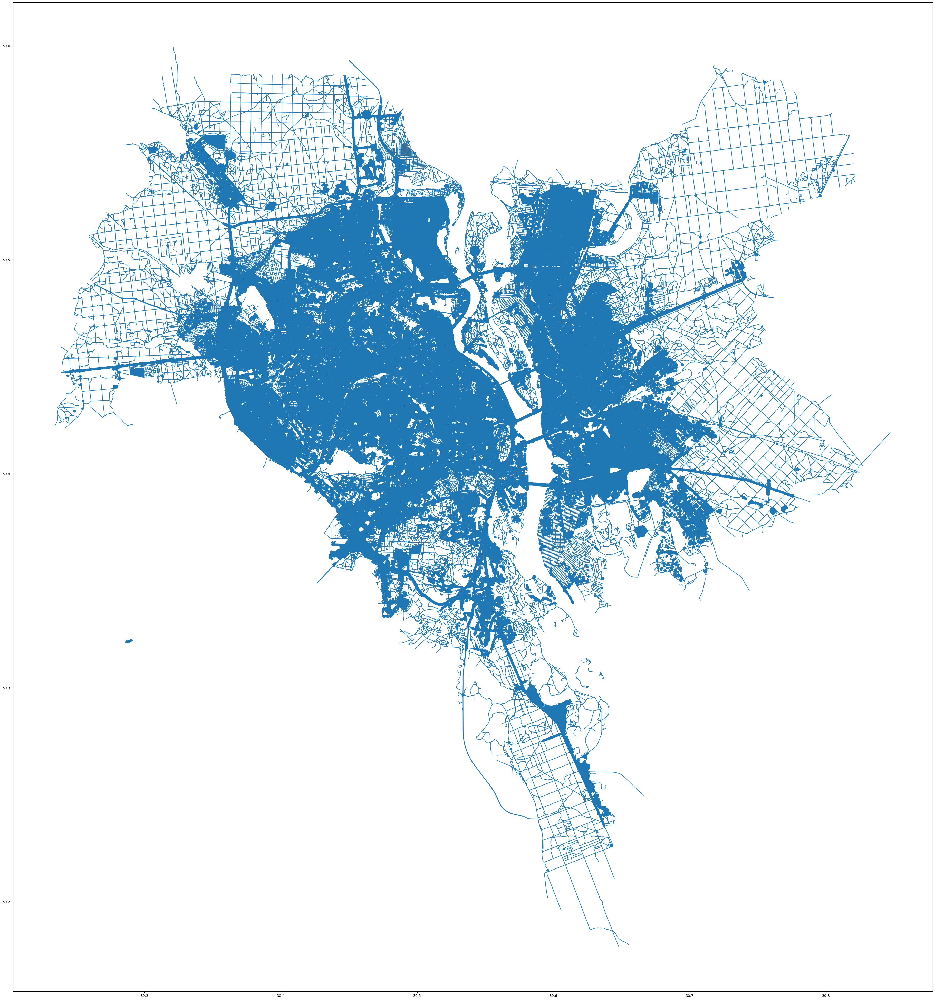

In [ ]:
gdf.plot(figsize=(50,50), legend=True)